In [1]:
import h5py
import numpy as np
import sys, os



# from matplotlib import animation
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
plt.rcParams['animation.ffmpeg_path'] = '/home/gupt1075/FourCastNet/'


In [2]:
# era sst

import xarray as xr
import numpy as np
import pandas as pd
import netCDF4
from matplotlib import pyplot as plt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from datetime import datetime
import matplotlib
from matplotlib import cm
import matplotlib.ticker as mticker
import cmocean

In [3]:

original_data = "/scratch/gilbreth/wwtung/FourCastNet/data/train/1979.h5"
predicted_data = "/scratch/gilbreth/gupt1075/ERA5_expts_gtc_2/autoregressive_predictions_z500.h5"



# filename = os.path.join(path,"1979.h5")

<KeysViewHDF5 ['fields']>
(1460, 21, 721, 1440)


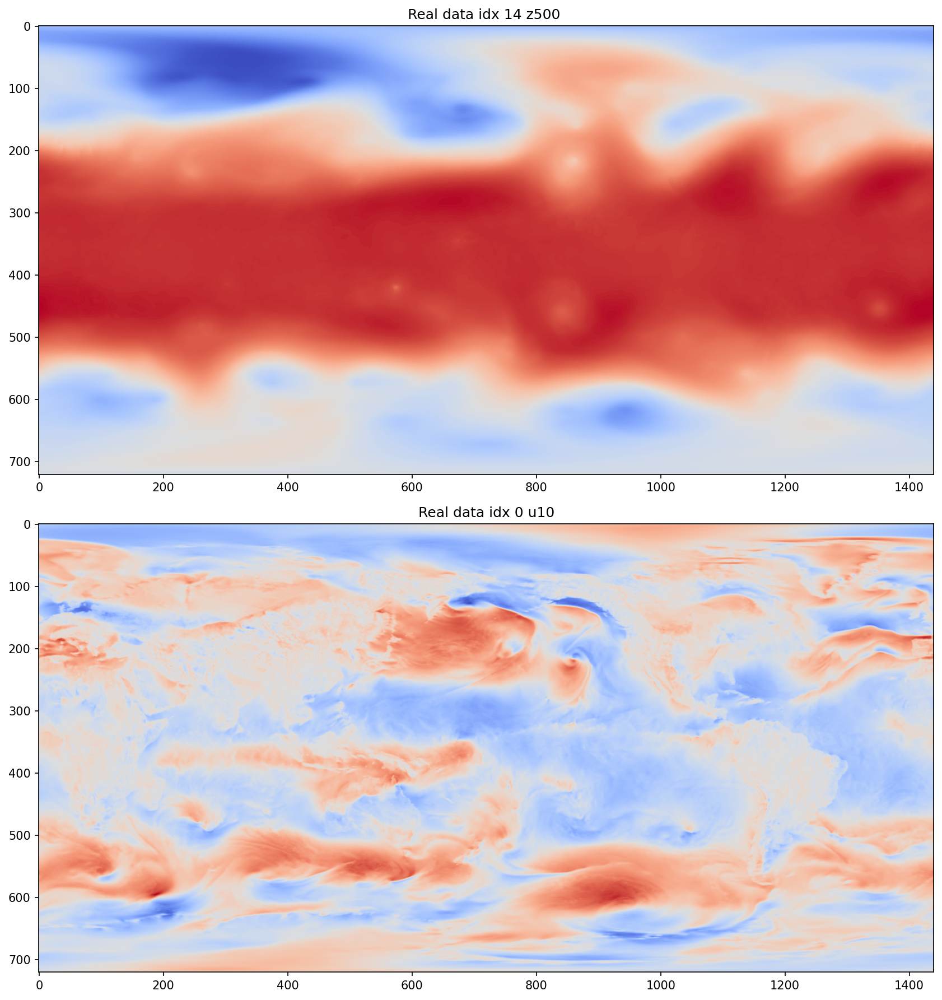

In [5]:
with h5py.File(original_data, 'r') as hf:
    print(hf.keys())
    data = hf['fields']
    print(data.shape)
    z500 = data[0,14]
    u10 = data[0,0]
    fig, ax = plt.subplots(2, 1, figsize=(24,12))
    ax[0].imshow(z500, cmap="coolwarm")
    ax[0].set_title("Real data idx 14 z500 ")
    ax[1].imshow(u10, cmap="coolwarm")
    ax[1].set_title("Real data idx 0 u10")
    fig.tight_layout()
    # plt.savefig("./snapshots_ERA5_original_data.png", dpi = 400)

In [ ]:


# with h5py.File(filename, "r") as f:
#     # Print all root level object names (aka keys) 
#     # these can be group or dataset names 
#     print(f"Keys: {f.keys()} ")
#     # get first object name/key; may or may NOT be a group
#     a_group_key = list(f.keys())[0]

#     # get the object type for a_group_key: usually group or dataset
#     print(type(f[a_group_key])) 

#     # If a_group_key is a group name, 
#     # this gets the object names in the group and returns as a list
#     data = list(f[a_group_key])

#     # If a_group_key is a dataset name, 
#     # this gets the dataset values and returns as a list
#     data = list(f[a_group_key])
#     # preferred methods to get dataset values:
#     ds_obj = f[a_group_key]      # returns as a h5py dataset object
#     ds_arr = f[a_group_key][()]  # returns as a numpy array
    
    
    

#     dset = f['key'][:]
#     img = Image.fromarray(dset.astype("uint8"), "RGB")
#     img.save("./test.png")
    
#     print(f" ds_obj: {ds_obj} ds_arr: {ds_arr} ")
    
    
  

In [ ]:
  
def h5_tree(val, pre=''):
    items = len(val)
    for key, val in val.items():
        items -= 1
        if items == 0:
            # the last item
            if type(val) == h5py._hl.group.Group:
                print(pre + '└── ' + key)
                h5_tree(val, pre+'    ')
            else:
                print(pre + '└── ' + key + ' (%d)' % len(val))
        else:
            if type(val) == h5py._hl.group.Group:
                print(pre + '├── ' + key)
                h5_tree(val, pre+'│   ')
            else:
                print(pre + '├── ' + key + ' (%d)' % len(val))


                

<KeysViewHDF5 ['fields']>
(1460, 21, 721, 1440)


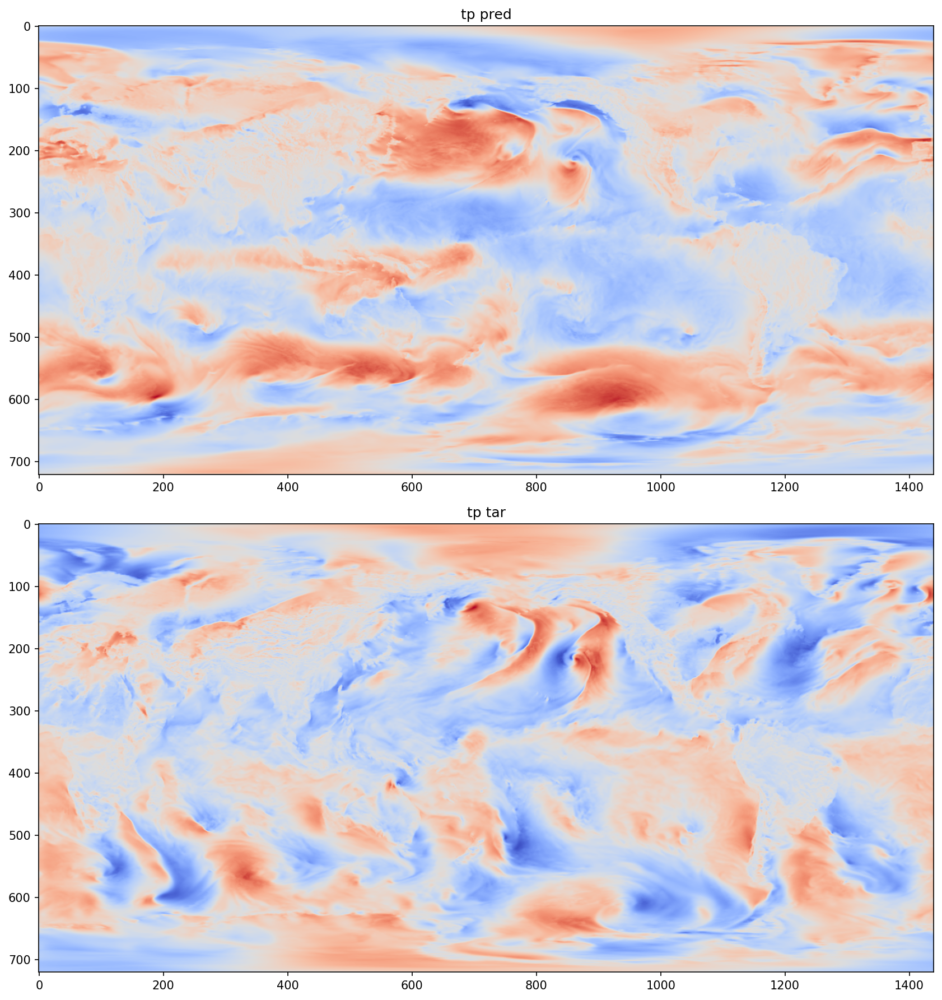

In [9]:

output_list = []

directory= "/scratch/gilbreth/gupt1075/ERA5_expts_z500_trial_3"
output_frame = 3 
seq_real = f"{directory}/seq_real_output_{output_frame}.npy"
seq_pred = f"{directory}/seq_pred_output_{output_frame}.npy"



with open( seq_real , 'rb') as f:
    a = np.load(f)
    output_list.append(a)


with open(seq_pred, 'rb') as f:
    b = np.load(f)
    output_list.append(b)



print(f" shape: {output_list[0].shape} ")
    

 shape: (41, 20, 720, 1440) 


 (720, 1440), (720, 1440)


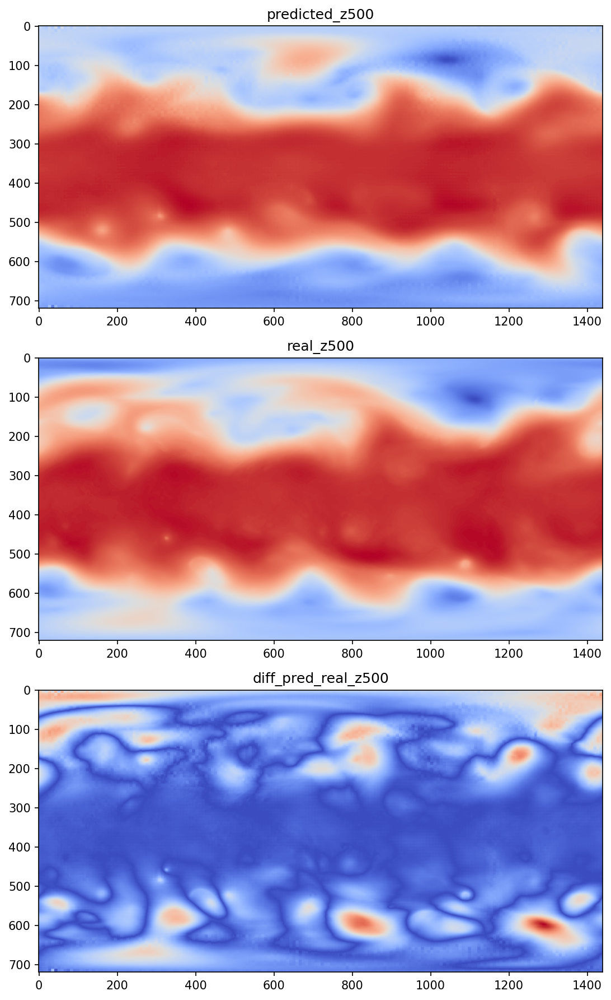

In [18]:

idx = 35
fld = "z500"
channel_tags = {"u10": 0, "z500": 14, "2m_temperature": 2, "v10": 1, "t850": 5}
channel=channel_tags[fld]

real = output_list[0][idx,channel]
pred = output_list[1][idx,channel]

print(f" {pred.shape}, {real.shape}")



# set up variables
lat = np.linspace(-90, 90, 37)
lon = np.linspace(0, 359.9, 72)

# # create data to be plotted 
# mapdat = np.reshape(np.random.normal(loc=0.,size=72*37),(37,72))

##
# plt.figure(figsize=(14., 7.))

#using the basemap package to put the cylindrical projection map into the image
# ReAn = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
#             llcrnrlon=-180.,urcrnrlon=180.,resolution='c')

# #shifting the data because 
# lons, data = ReAn.shiftdata(lon, datain = mapdat, lon_0=0)

#draw coastlines, latitudes, and longitudes on the map
# ReAn.drawcoastlines(color='black', linewidth=1)
# ReAn.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1])
# ReAn.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1])
# ReAn.drawcountries()




fig, ax = plt.subplots(3, 1, figsize=(24,12))

# # create axis using cartopy projections, add in coastlines & grid
# ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree(central_longitude=260))


ax[0].imshow(pred, cmap="coolwarm" )
# ax[0].add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
# ax[0].grid(visible=True)
ax[0].set_title(f"predicted_{fld}")

ax[1].imshow(real, cmap="coolwarm")
ax[1].set_title(f"real_{fld}")


ax[2].imshow(abs(pred-real), cmap="coolwarm")
ax[2].set_title(f"diff_pred_real_{fld}")


fig.tight_layout()
# plt.savefig(f"./comparing_results_inference_{output_frame}_{fld}.png", dpi = 200)

In [ ]:
# Usually we use `%matplotlib inline`. However we need `notebook` for the anim to render in the notebook.
%matplotlib notebook

import random
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

import matplotlib.animation as animation


fps = 30
nSeconds = 5

hf = h5py.File(filename, 'r')
ndarray = np.array(hf["fields"][:])
print(ndarray.shape)
snapshots = ndarray[:,0]
print(snapshots.shape)

# # First set up the figure, the axis, and the plot element we want to animate
# fig = plt.figure( figsize=(8,8) )

# a = snapshots[0]
# im = plt.imshow(a, interpolation='none', aspect='auto')

# def animate_func(i):
#     if i % fps == 0:
#         print( '.', end ='' )

#     im.set_array(snapshots[i])
#     return [im]

# anim = animation.FuncAnimation(
#                                fig, 
#                                animate_func, 
#                                frames = nSeconds * fps,
#                                interval = 1000 / fps, # in ms
#                                )

# anim.save('test_anim.mp4', fps=fps, extra_args=['-vcodec', 'libx264'])

# print('Done!')

# plt.show()  # Not required, it seems!


In [ ]:




# fig = plt.figure()
# # ax = plt.axes(xlim=(0, 2), ylim=(-2, 2))
# # line, = ax.plot([], [], lw=2)

# def init():
#     with h5py.File(filename, 'r') as hf:
#         data = hf['fields']
#         pred = data[0,0]
#         return pred
# def animate(i):
#     with h5py.File(filename, 'r') as hf:
#         data = hf['fields']
#         pred = data[i,0]
#         return pred

# anim = animation.FuncAnimation(fig, animate, init_func=init, frames=200, interval=20, blit=True)

# FFwriter = animation.FFMpegWriter(fps=30, extra_args=['-vcodec', 'libx264'])
# anim.save('basic_animation.mp4', writer=FFwriter)


In [ ]:

%matplotlib widget

fig = plt.figure()
i=0

hf = h5py.File(filename, 'r')
ndarray = np.array(hf["fields"][:])

im = plt.imshow(ndarray[i,0], animated=True)
def updatefig(*args):
    global i
    if (i<1400):
        i += 1
    else:
        i=0
    im.set_array(ndarray[i,0])
    return im
ani = animation.FuncAnimation(fig, updatefig, blit=True)
plt.show()

# FFwriter = animation.FFMpegWriter(fps=30, extra_args=['-vcodec', 'libx264'])
# anim.save('fourcastnet_gif.mp4', writer=FFwriter)

In [ ]:
#Snapshot


In [ ]:

with h5py.File(filename, "r") as f:
    # Print all root level object names (aka keys) 
    # these can be group or dataset names 
    print(f"Keys: {f.keys()} ")
    # get first object name/key; may or may NOT be a group
    a_group_key = list(f.keys())[0]

    # get the object type for a_group_key: usually group or dataset
    print(type(f[a_group_key])) 

    # If a_group_key is a group name, 
    # this gets the object names in the group and returns as a list
    data = list(f[a_group_key])

    # If a_group_key is a dataset name, 
    # this gets the dataset values and returns as a list
    data = list(f[a_group_key])
    # preferred methods to get dataset values:
    ds_obj = f[a_group_key]      # returns as a h5py dataset object
    ds_arr = f[a_group_key][()]  # returns as a numpy array
    
    dset = f['key'][:]
    img = Image.fromarray(dset.astype("uint8"), "RGB")
    img.save("./test.png")
    
    print(f" ds_obj: {ds_obj} ds_arr: {ds_arr} ")
    
    
  

 shape: (41, 20, 720, 1440) 
 (720, 1440), (720, 1440)


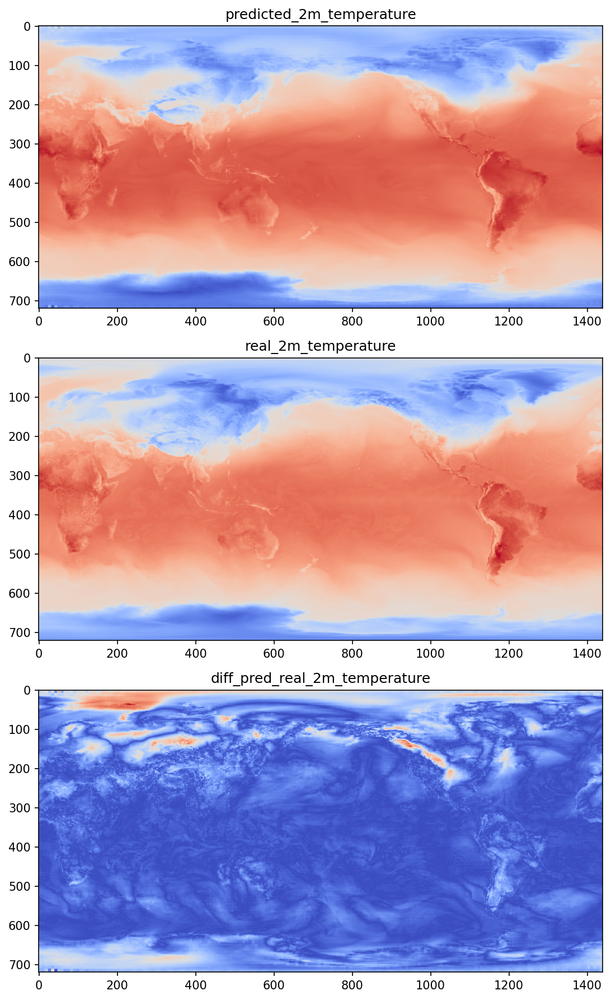

In [20]:




output_list = []

directory= "/scratch/gilbreth/gupt1075/ERA5_expts_2m_temperature_trial_1"
output_frame = 3 
seq_real = f"{directory}/seq_real_output_{output_frame}.npy"
seq_pred = f"{directory}/seq_pred_output_{output_frame}.npy"



with open( seq_real , 'rb') as f:
    a = np.load(f)
    output_list.append(a)


with open(seq_pred, 'rb') as f:
    b = np.load(f)
    output_list.append(b)



print(f" shape: {output_list[0].shape} ")
    





idx = 2
fld = "2m_temperature"
channel_tags = {"u10": 0, "z500": 14, "2m_temperature": 2, "v10": 1, "t850": 5}
channel=channel_tags[fld]

real = output_list[0][idx,channel]
pred = output_list[1][idx,channel]

print(f" {pred.shape}, {real.shape}")



# set up variables
lat = np.linspace(-90, 90, 37)
lon = np.linspace(0, 359.9, 72)

# # create data to be plotted 
# mapdat = np.reshape(np.random.normal(loc=0.,size=72*37),(37,72))

##
# plt.figure(figsize=(14., 7.))

#using the basemap package to put the cylindrical projection map into the image
# ReAn = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
#             llcrnrlon=-180.,urcrnrlon=180.,resolution='c')

# #shifting the data because 
# lons, data = ReAn.shiftdata(lon, datain = mapdat, lon_0=0)

#draw coastlines, latitudes, and longitudes on the map
# ReAn.drawcoastlines(color='black', linewidth=1)
# ReAn.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1])
# ReAn.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1])
# ReAn.drawcountries()




fig, ax = plt.subplots(3, 1, figsize=(24,12))

# # create axis using cartopy projections, add in coastlines & grid
# ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree(central_longitude=260))


ax[0].imshow(pred, cmap="coolwarm" )
# ax[0].add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
# ax[0].grid(visible=True)
ax[0].set_title(f"predicted_{fld}")

ax[1].imshow(real, cmap="coolwarm")
ax[1].set_title(f"real_{fld}")


ax[2].imshow(abs(pred-real), cmap="coolwarm")
ax[2].set_title(f"diff_pred_real_{fld}")


fig.tight_layout()
# plt.savefig(f"./comparing_results_inference_{output_frame}_{fld}.png", dpi = 200)

 (720, 1440), (720, 1440)


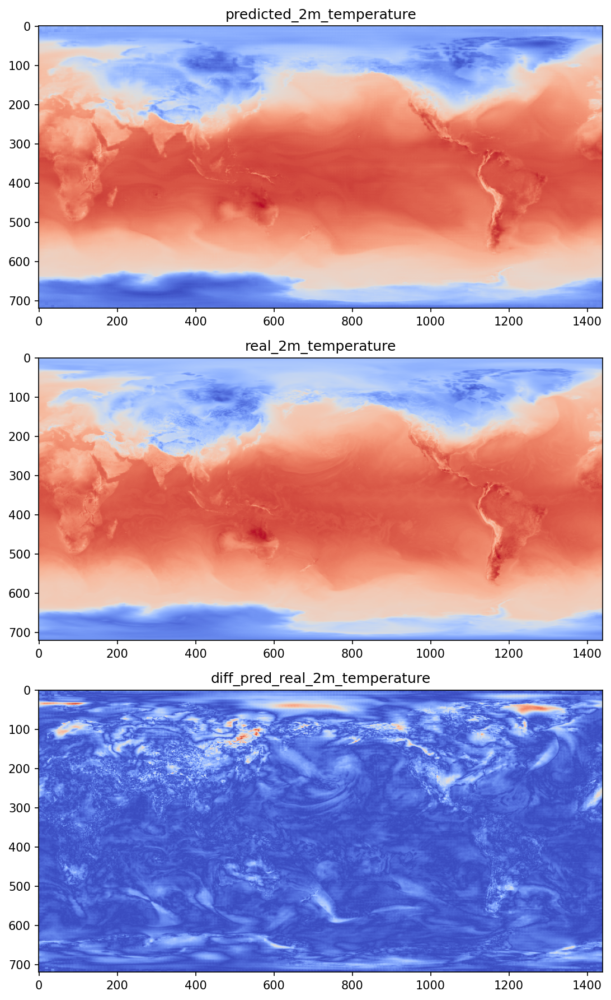

In [22]:

idx = 20
fld = "2m_temperature"
channel_tags = {"u10": 0, "z500": 14, "2m_temperature": 2, "v10": 1, "t850": 5}
channel=channel_tags[fld]

real = output_list[0][idx,channel]
pred = output_list[1][idx,channel]

print(f" {pred.shape}, {real.shape}")



# set up variables
lat = np.linspace(-90, 90, 37)
lon = np.linspace(0, 359.9, 72)

# # create data to be plotted 
# mapdat = np.reshape(np.random.normal(loc=0.,size=72*37),(37,72))

##
# plt.figure(figsize=(14., 7.))

#using the basemap package to put the cylindrical projection map into the image
# ReAn = Basemap(projection='cyl',llcrnrlat=-90.,urcrnrlat=90.,\
#             llcrnrlon=-180.,urcrnrlon=180.,resolution='c')

# #shifting the data because 
# lons, data = ReAn.shiftdata(lon, datain = mapdat, lon_0=0)

#draw coastlines, latitudes, and longitudes on the map
# ReAn.drawcoastlines(color='black', linewidth=1)
# ReAn.drawparallels(np.arange(-90.,91.,30.), labels = [1,0,0,1])
# ReAn.drawmeridians(np.arange(-180.,181.,60.), labels= [1,0,0,1])
# ReAn.drawcountries()




fig, ax = plt.subplots(3, 1, figsize=(24,12))

# # create axis using cartopy projections, add in coastlines & grid
# ax = fig.add_subplot(1,1,1,projection=ccrs.PlateCarree(central_longitude=260))


ax[0].imshow(pred, cmap="coolwarm" )
# ax[0].add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
# ax[0].grid(visible=True)
ax[0].set_title(f"predicted_{fld}")

ax[1].imshow(real, cmap="coolwarm")
ax[1].set_title(f"real_{fld}")


ax[2].imshow(abs(pred-real), cmap="coolwarm")
ax[2].set_title(f"diff_pred_real_{fld}")


fig.tight_layout()
# plt.savefig(f"./comparing_results_inference_{output_frame}_{fld}.png", dpi = 200)